In [11]:
import os
from multiprocessing import Pool
from functools import partial

import matplotlib.pylab as plt
import seaborn as sns
import numpy as np
import numpy.linalg as la
from scipy.sparse import csc_matrix, csr_matrix
from tqdm.auto import tqdm

from datasets import get_dataset
from first_order import Ig, Nesterov
from loss_functions import Quadratic
from stochastic_first_order import Sgd, Shuffling, ClippedShuffling
from utils import get_trace, relative_round
%load_ext autoreload
%autoreload 2

import matplotlib
sns.set(style="whitegrid", font_scale=1.2, context="talk", palette=sns.color_palette("bright"), color_codes=False)
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['figure.figsize'] = (8, 6)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
# %%html
# <style>
# .cell-output-ipywidget-background {
#    background-color: transparent !important;
# }
# .jp-OutputArea-output {
#    background-color: transparent;
# }  
# .jupyter-widgets {color: #d5d5d5 !important;}
# .widget-label {color: #d5d5d5 !important;}
# </style>

# Functions spread on the edges of interval

In [14]:
dataset = 'quadratic_noised'
# x = np.append(np.arange(0, 501), np.arange(1e5 - 500, 1e5 + 1))
np.random.seed(0)
if dataset == 'quadratic':
    x = np.append(np.random.randint(0, 501, 500), 
                  np.random.randint(1e5 - 500, 1e5 + 1, 500))
elif dataset == 'quadratic_noised':
    n_left_functions = 300
    var = 3
    x = np.append(
        np.random.randint(0, 501, n_left_functions) + np.random.normal(0, var, size=n_left_functions), 
        np.random.randint(1e5 - 500, 1e5 + 1, 1000 - n_left_functions) + \
            np.random.normal(0, var, size=1000 - n_left_functions))
loss = Quadratic(x)
f_opt = loss.f_opt
x_opt = loss.x_opt
n, dim = len(x), 1
L = loss.smoothness()
# x0 = np.array([3 * 1e4])
x0 = np.array([x_opt])
n_epochs = 10000
batch_size = 32
# n_seeds = 2 # was set to 20 in the paper
n_seeds = 10
stoch_it = n_epochs * n // batch_size
trace_len = 300

if x0 == x_opt:
    trace_path = f'results/{dataset}/x0_x_opt/bs_{batch_size}/'
    plot_path = f'plots/{dataset}/x0_x_opt/bs_{batch_size}'
else:
    trace_path = f'results/{dataset}/x0_{x0[0]}/bs_{batch_size}/'
    plot_path = f'plots/{dataset}/x0_{x0[0]}/bs_{batch_size}'
if not os.path.exists(trace_path):
    os.makedirs(trace_path)

step_size_list = np.logspace(-3, 0, 4)
# clip_level_list = np.logspace(-3, 3, 7)
clip_level_list = np.logspace(1, 5, 5)
print('step sizes:', step_size_list)
print('clip levels:', clip_level_list)
print('trace path:', trace_path)

step sizes: [0.001 0.01  0.1   1.   ]
clip levels: [1.e+01 1.e+02 1.e+03 1.e+04 1.e+05]
trace path: results/quadratic_noised/x0_x_opt/bs_32/


In [15]:
f_opt, x_opt

(2079384375147.0093, 69896.37714080737)

In [16]:
def best_trace_by_step_size(traces, step_size_list):
    min_i, min_val = 0, np.inf
    for i, tr in enumerate(traces):
        if tr.loss_vals is None:
            mean_loss_val = 0
            for loss_vals in tr.loss_vals_all.values():
                mean_loss_val += np.mean(loss_vals)
            mean_loss_val /= len(tr.loss_vals_all)
        else:
            mean_loss_val = np.mean(tr.loss_vals)
        if mean_loss_val < min_val:
            min_val = mean_loss_val
            min_i = i
    
    best_trace = traces[min_i]
    best_trace.step_size = step_size_list[min_i]
    return best_trace

## Experiments

### Random Reshuffling

In [17]:
rr_trace = get_trace(os.path.join(f'{trace_path}', f'rr_{n_epochs}'), loss)
if not rr_trace:
    rr_traces = []
    for step_size in tqdm(step_size_list):
        lr0 = step_size
        rr = Shuffling(
            loss=loss, 
            lr0=lr0, 
            it_max=stoch_it, 
            n_seeds=n_seeds, 
            batch_size=batch_size, 
            trace_len=trace_len
        )
        rr_trace = rr.run(x0=x0)
        rr_trace.convert_its_to_epochs(batch_size=batch_size)
        rr_trace.compute_loss_of_iterates()
        rr_traces.append(rr_trace)
    rr_trace = best_trace_by_step_size(rr_traces, step_size_list)
    print(f'Best step size: {rr_trace.step_size}')

In [18]:
rr_trace.save(f'rr_{n_epochs}', trace_path)

### Clipped random reshuffling

In [19]:
crr_traces = []
for clip_level in tqdm(clip_level_list):
    crr_trace = get_trace(os.path.join(f'{trace_path}', f'c_{clip_level}_rr_{n_epochs}'), loss)
    if not crr_trace:
        cl_crr_traces = []
        for step_size in step_size_list:
            lr0 = step_size
            crr = ClippedShuffling(
                loss=loss, 
                lr0=lr0, 
                it_max=stoch_it, 
                n_seeds=n_seeds, 
                batch_size=batch_size, 
                trace_len=trace_len,
                clip_level=clip_level,
                steps_per_permutation=np.inf
            )
            crr_trace = crr.run(x0=x0)
            crr_trace.convert_its_to_epochs(batch_size=batch_size)
            crr_trace.compute_loss_of_iterates()
            crr_trace.compute_last_iterate_grad_norms()
            cl_crr_traces.append(crr_trace)

        best_trace = best_trace_by_step_size(cl_crr_traces, step_size_list)
        crr_traces.append(best_trace)
    else:
        crr_traces.append(crr_trace)
for cl, trace in zip(clip_level_list, crr_traces):
    print(f'Best step size for clip level {cl}: {trace.step_size}')

  0%|          | 0/5 [00:00<?, ?it/s]

Best step size for clip level 10.0: 0.001
Best step size for clip level 100.0: 0.001
Best step size for clip level 1000.0: 0.001
Best step size for clip level 10000.0: 0.001
Best step size for clip level 100000.0: 0.001


In [20]:
for clip_level, crr_trace in zip(clip_level_list, crr_traces):
    crr_trace.save(f'c_{clip_level}_rr_{n_epochs}', trace_path)

### Clipped random reshuffling Opt

In [22]:
os.path.join(f'{trace_path}', f'c_{clip_level}_opt_rr_{n_epochs}')

'results/quadratic_noised/x0_x_opt/bs_32/c_10.0_opt_rr_10000'

In [23]:
crr_opt_traces = []
for clip_level in tqdm(clip_level_list):
    crr_opt_trace = get_trace(os.path.join(f'{trace_path}', f'c_{clip_level}_rr_opt_{n_epochs}'), loss)
    if not crr_opt_trace:
        cl_crr_opt_traces = []
        for step_size in step_size_list:
            lr0 = step_size
            crr_opt = ClippedShuffling(
                loss=loss, 
                lr0=lr0, 
                it_max=stoch_it, 
                n_seeds=n_seeds, 
                batch_size=batch_size, 
                trace_len=trace_len,
                clip_level=clip_level,
                x_opt=x_opt,
                steps_per_permutation=np.inf
            )
            crr_opt_trace = crr_opt.run(x0=x0)
            crr_opt_trace.convert_its_to_epochs(batch_size=batch_size)
            crr_opt_trace.compute_loss_of_iterates()
            crr_opt_trace.compute_last_iterate_grad_norms()
            cl_crr_opt_traces.append(crr_opt_trace)

        best_trace = best_trace_by_step_size(cl_crr_opt_traces, step_size_list)
        crr_opt_traces.append(best_trace)
    else:
        crr_opt_traces.append(crr_opt_trace)

for cl, trace in zip(clip_level_list, crr_opt_traces):
    print(f'Best step size for clip level {cl}: {trace.step_size}')

  0%|          | 0/5 [00:00<?, ?it/s]

Best step size for clip level 10.0: 0.001
Best step size for clip level 100.0: 0.001
Best step size for clip level 1000.0: 0.001
Best step size for clip level 10000.0: 0.001
Best step size for clip level 100000.0: 0.001


In [24]:
for clip_level, crr_opt_trace in zip(clip_level_list, crr_opt_traces):
    crr_opt_trace.save(f'c_{clip_level}_rr_opt_{n_epochs}', trace_path)

### Clipping with shifts

In [25]:
clip_level_list

array([1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05])

In [26]:
# alpha_shift_list = np.logspace(-2, 2, 5)
# a_crr_shift_traces_dict = {}
# for alpha_shift in tqdm(alpha_shift_list):
#     a_crr_shift_traces_dict[alpha_shift] = []
#     for clip_level in clip_level_list:
#         print('clip_level')
#         crr_shift_trace = get_trace(os.path.join(f'{trace_path}', f'c_{clip_level}_a_shift_{alpha_shift}_rr_{n_epochs}'), loss)
#         if not crr_shift_trace:        
#             cl_crr_shift_traces = []
#             for step_size in step_size_list:
#                 lr0 = step_size
#                 crr_shift = ClippedShuffling(
#                     loss=loss, 
#                     lr0=lr0, 
#                     it_max=stoch_it, 
#                     n_seeds=n_seeds, 
#                     batch_size=batch_size, 
#                     trace_len=trace_len,
#                     clip_level=clip_level,
#                     alpha_shift=alpha_shift,
#                     steps_per_permutation=np.inf
#                 )
#                 crr_shift_trace = crr_shift.run(x0=x0)
#                 crr_shift_trace.convert_its_to_epochs(batch_size=batch_size)
#                 crr_shift_trace.compute_loss_of_iterates()
#                 crr_shift_trace.compute_last_iterate_grad_norms()
#                 cl_crr_shift_traces.append(crr_shift_trace)

#             best_trace = best_trace_by_step_size(cl_crr_shift_traces, step_size_list)
#             a_crr_shift_traces_dict[alpha_shift].append(best_trace)
#         else:
#             a_crr_shift_traces_dict[alpha_shift].append(crr_shift_trace)

# for alpha, cl_crr_shift_traces in a_crr_shift_traces_dict.items():
#     for cl, trace in zip(clip_level_list, cl_crr_shift_traces):
#         print(f'Best step size for alpha {alpha}, clip level {cl}: {trace.step_size}')

In [27]:
# for alpha_shift in a_crr_shift_traces_dict:
#     for clip_level, crr_trace in zip(clip_level_list, a_crr_shift_traces_dict[alpha_shift]):
#         crr_trace.save(f'c_{clip_level}_a_shift_{alpha_shift}_rr', trace_path)

### Single reshuffling

In [28]:
so_trace = get_trace(os.path.join(f'{trace_path}', f'so_{n_epochs}'), loss)
if not so_trace:
    so_traces = []
    for step_size in tqdm(step_size_list):
        lr0 = step_size
        so = Shuffling(
            loss=loss, 
            lr0=lr0, 
            it_max=stoch_it, 
            n_seeds=n_seeds, 
            batch_size=batch_size, 
            steps_per_permutation=np.inf, 
            trace_len=trace_len
        )
        so_trace = so.run(x0=x0)
        so_trace.convert_its_to_epochs(batch_size=batch_size)
        so_trace.compute_loss_of_iterates()
        so_traces.append(so_trace)
    so_trace = best_trace_by_step_size(so_traces, step_size_list)
print(f'best step size: {so_trace.step_size}')

best step size: 0.001


In [29]:
so_trace.save(f'so_{n_epochs}', trace_path)

### SGD

In [30]:
sgd_trace = get_trace(os.path.join(f'{trace_path}', f'sgd_{n_epochs}'), loss)
if not sgd_trace:
    sgd_traces = []
    for step_size in tqdm(step_size_list):
        lr0 = step_size
        sgd = Sgd(
            loss=loss,
            lr0=lr0, 
            it_max=stoch_it, 
            n_seeds=n_seeds, 
            batch_size=batch_size, 
            avoid_cache_miss=True, 
            trace_len=trace_len
        )
        sgd_trace = sgd.run(x0=x0)
        sgd_trace.convert_its_to_epochs(batch_size=batch_size)
        sgd_trace.compute_loss_of_iterates()
        sgd_traces.append(sgd_trace)
    sgd_trace = best_trace_by_step_size(sgd_traces, step_size_list)
print(f'best step size: {sgd_trace.step_size}')

best step size: 1e-05


In [31]:
sgd_trace.save(f'sgd_{n_epochs}', trace_path)

### Deterministic reshuffling

In [32]:
ig_trace = get_trace(os.path.join(f'{trace_path}', f'ig_{n_epochs}'), loss)
if not ig_trace:
    ig_traces = []
    for step_size in tqdm(step_size_list):
        lr0 = step_size
        ig = Ig(
            loss=loss, 
            lr0=lr0, 
            it_max=stoch_it, 
            batch_size=batch_size, 
            trace_len=trace_len
        )
        ig_trace = ig.run(x0=x0)
        ig_trace.convert_its_to_epochs(batch_size=batch_size)
        ig_trace.compute_loss_of_iterates()
        ig_traces.append(ig_trace)
    ig_trace = best_trace_by_step_size(ig_traces, step_size_list)
print(f'best step size: {ig_trace.step_size}')

best step size: 1e-05


In [33]:
ig_trace.save(f'ig_{n_epochs}', trace_path)

## Plots

In [34]:
ncols = 2 if len(clip_level_list) >= 2 else 1
nrows = int(np.ceil(len(clip_level_list) / 2))
fig_x = 18
fig_y = 28

### Everything with CRR without shifts

#### Functional residual

In [35]:
trace_path, plot_path

('results/quadratic_noised/x0_x_opt/bs_32/',
 'plots/quadratic_noised/x0_x_opt/bs_32')

In [36]:
if not os.path.exists(plot_path):
    os.makedirs(plot_path)

/Users/postrou/Documents/mbzuai/clipped_random_reshuffling/opt_trace.py:164: RuntimeWarning: divide by zero encountered in log
  y_log = [np.log(loss_vals-f_opt) for loss_vals in self.loss_vals_all.values()]
/Users/postrou/miniconda3/envs/crr/lib/python3.11/site-packages/numpy/core/_methods.py:173: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


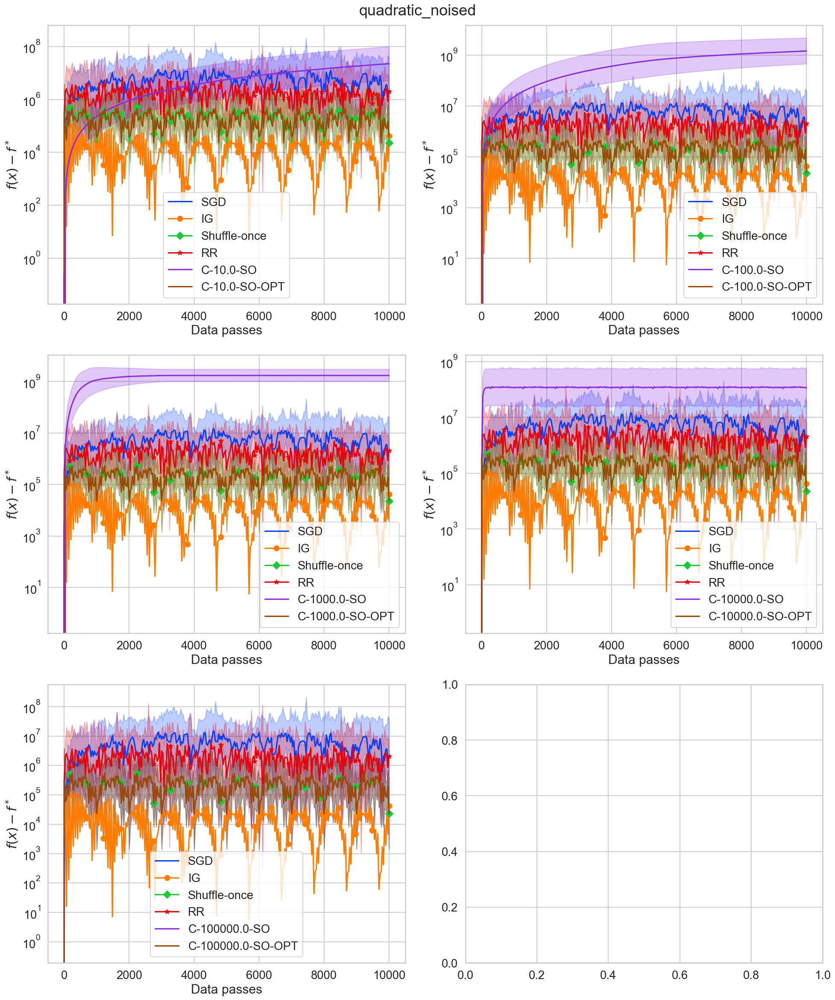

In [37]:
fig, axis = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 10, nrows * 8))
for ax, c_rr_trace, c_rr_opt_trace, clip_level in zip(axis.flatten(), crr_traces, crr_opt_traces, clip_level_list):
    traces = [sgd_trace, ig_trace, so_trace, rr_trace, c_rr_trace, c_rr_opt_trace]
    labels = ['SGD', 'IG', 'Shuffle-once', 'RR', f'C-{clip_level}-SO', f'C-{clip_level}-SO-OPT']
    markers = [',', 'o', 'D', '*', ',', ',']
    for trace, label, marker in zip(traces, labels, markers):
        trace.plot_losses(f_opt=f_opt, label=label, ax=ax, marker=marker)
    ax.set_yscale('log')
    ax.legend()
    ax.set_xlabel('Data passes')
fig.suptitle(dataset)
fig.tight_layout()
plt.savefig(os.path.join(plot_path, f'{dataset}_rr_func.png'))

#### Distance to solution

/Users/postrou/Documents/mbzuai/clipped_random_reshuffling/opt_trace.py:203: RuntimeWarning: divide by zero encountered in log
  y_log = [np.log(dist) for dist in dists]


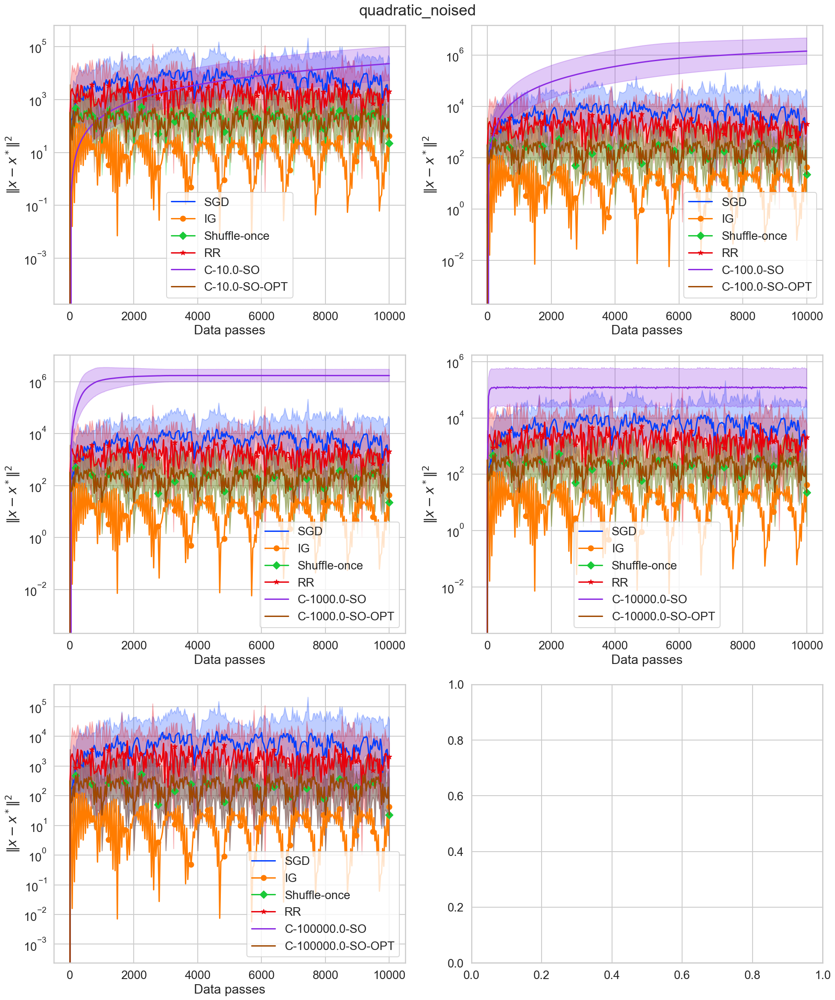

In [38]:
fig, axis = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 10, nrows * 8))
for ax, c_rr_trace, c_rr_opt_trace, clip_level in zip(axis.flatten(), crr_traces, crr_opt_traces, clip_level_list):
    traces = [sgd_trace, ig_trace, so_trace, rr_trace, c_rr_trace, c_rr_opt_trace]
    labels = ['SGD', 'IG', 'Shuffle-once', 'RR', f'C-{clip_level}-SO', f'C-{clip_level}-SO-OPT']
    markers = [',', 'o', 'D', '*', ',', ',']
    for trace, label, marker in zip(traces, labels, markers):
        trace.plot_distances(x_opt=x_opt, label=label, ax=ax, marker=marker)
    ax.set_yscale('log')
    ax.legend()
    ax.set_xlabel('Data passes')
fig.suptitle(dataset)
fig.tight_layout()
plt.savefig(os.path.join(plot_path, f'{dataset}_rr_dist.png'))

### Only CRR

#### Functional residual

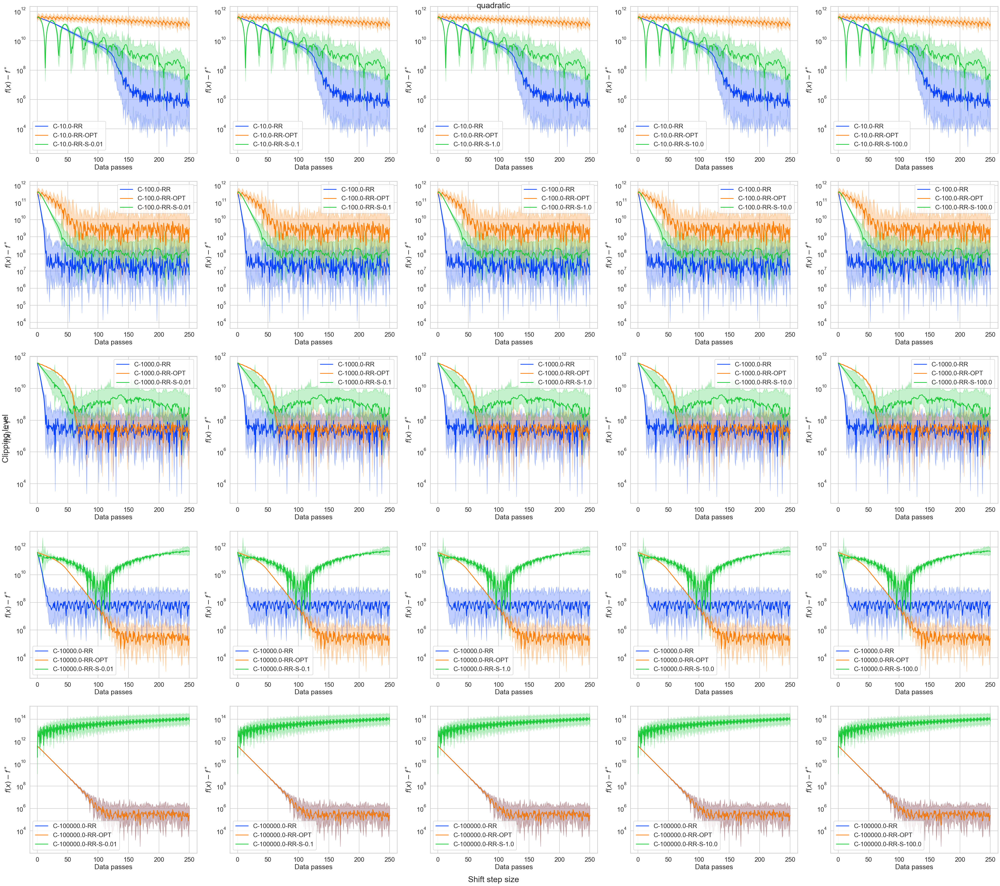

In [134]:
nrows = len(clip_level_list)
ncols = len(alpha_shift_list)
fig, axis = plt.subplots(nrows, ncols, figsize=(ncols * 9, ncols * 8))
for i, cl in enumerate(clip_level_list):
    for j, a in enumerate(alpha_shift_list):
        ax = axis[i][j]
        crr_trace, crr_opt_trace = crr_traces[i], crr_opt_traces[i]
        alpha_shift_trace = a_crr_shift_traces_dict[alpha_shift][i]
        crr_trace.plot_losses(f_opt=f_opt, label=f'C-{cl}-RR', ax=ax)
        crr_opt_trace.plot_losses(f_opt=f_opt, label=f'C-{cl}-RR-OPT', ax=ax)
        alpha_shift_trace.plot_losses(f_opt=f_opt, label=f'C-{cl}-RR-S-{a}', ax=ax)

        ax.set_yscale('log')
        ax.legend()
        ax.set_xlabel('Data passes')
fig.suptitle(dataset)
fig.supylabel('Clipping level')
fig.supxlabel('Shift step size')
fig.tight_layout()
plt.savefig(f'./plots/{dataset}/{dataset}_func_rr_opt_shift.png', dpi=300)

#### Distance to solution

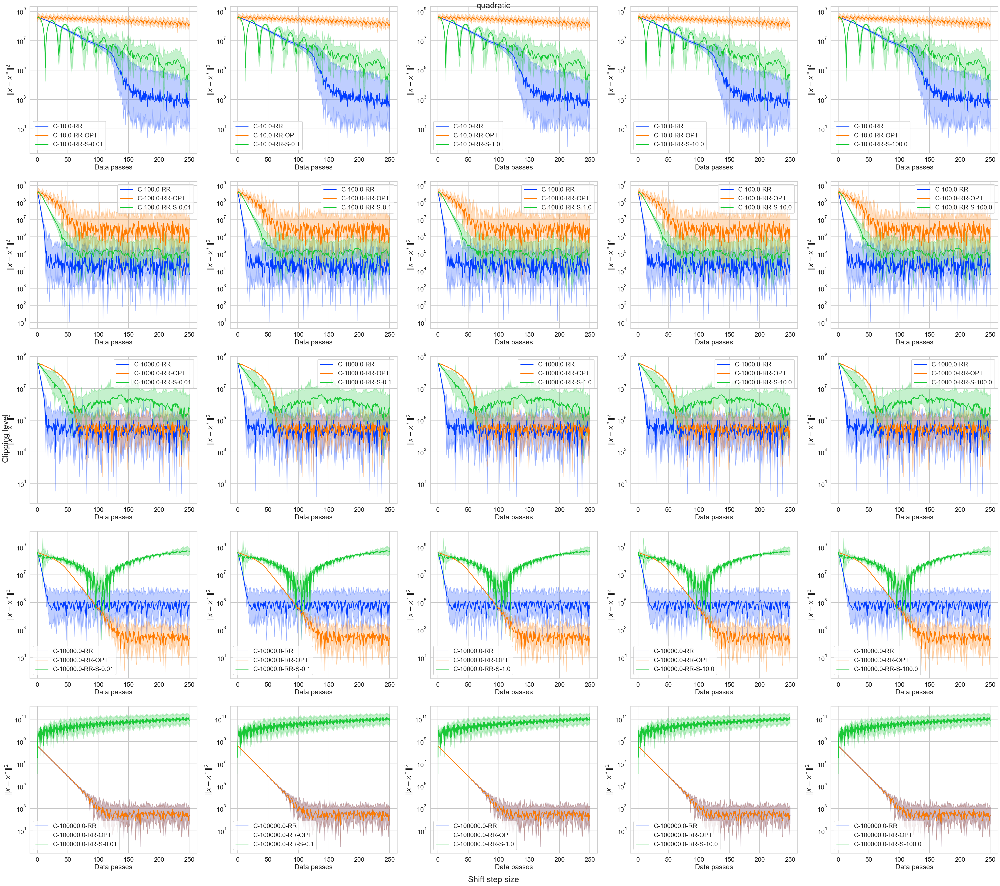

In [135]:
nrows = len(clip_level_list)
ncols = len(alpha_shift_list)
fig, axis = plt.subplots(nrows, ncols, figsize=(ncols * 9, ncols * 8))
for i, cl in enumerate(clip_level_list):
    for j, a in enumerate(alpha_shift_list):
        ax = axis[i][j]
        crr_trace, crr_opt_trace = crr_traces[i], crr_opt_traces[i]
        alpha_shift_trace = a_crr_shift_traces_dict[alpha_shift][i]
        crr_trace.plot_distances(x_opt=x_opt, label=f'C-{cl}-RR', ax=ax)
        crr_opt_trace.plot_distances(x_opt=x_opt, label=f'C-{cl}-RR-OPT', ax=ax)
        alpha_shift_trace.plot_distances(x_opt=x_opt, label=f'C-{cl}-RR-S-{a}', ax=ax)

        ax.set_yscale('log')
        ax.legend()
        ax.set_xlabel('Data passes')
fig.suptitle(dataset)
fig.supylabel('Clipping level')
fig.supxlabel('Shift step size')
fig.tight_layout()
plt.savefig(f'./plots/{dataset}/{dataset}_dist_rr_opt_shift.png', dpi=300)